# Data Analysis
## Class 13
#### October 23th

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
reporte = pd.read_excel('Reporte_Hist_Viaje_11_05_09.17.xls', header=1, sheet_name=0)
fallas = pd.read_excel('Reporte_Hist_Viaje_11_05_09.17.xls', header=0, sheet_name=1)

In [3]:
reporte.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2822 entries, 0 to 2821
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Altitud (m)              2822 non-null   float64
 1   Temp Refrigerante (°C)   813 non-null    float64
 2   Temp Aceite (°C)         813 non-null    float64
 3   Pres Aceite (kPa)        2822 non-null   float64
 4   Pres Turbo (kPa)         2822 non-null   float64
 5   Velocidad (Km/h)         2822 non-null   float64
 6   Revoluciones (rpm)       2822 non-null   int64  
 7   Combustible (l)          2822 non-null   float64
 8   Factor Carga (%)         2822 non-null   float64
 9   Fecha                    2822 non-null   object 
 10  km recorridos            2822 non-null   float64
 11  Ignición                 2822 non-null   object 
 12  Combustible x Viaje (l)  2822 non-null   float64
 13  Rendimiento (km/l)       2822 non-null   float64
dtypes: float64(11), int64(1)

In [4]:
reporte.iloc[:,1].isnull().sum()/len(reporte)*100

71.19064493267186

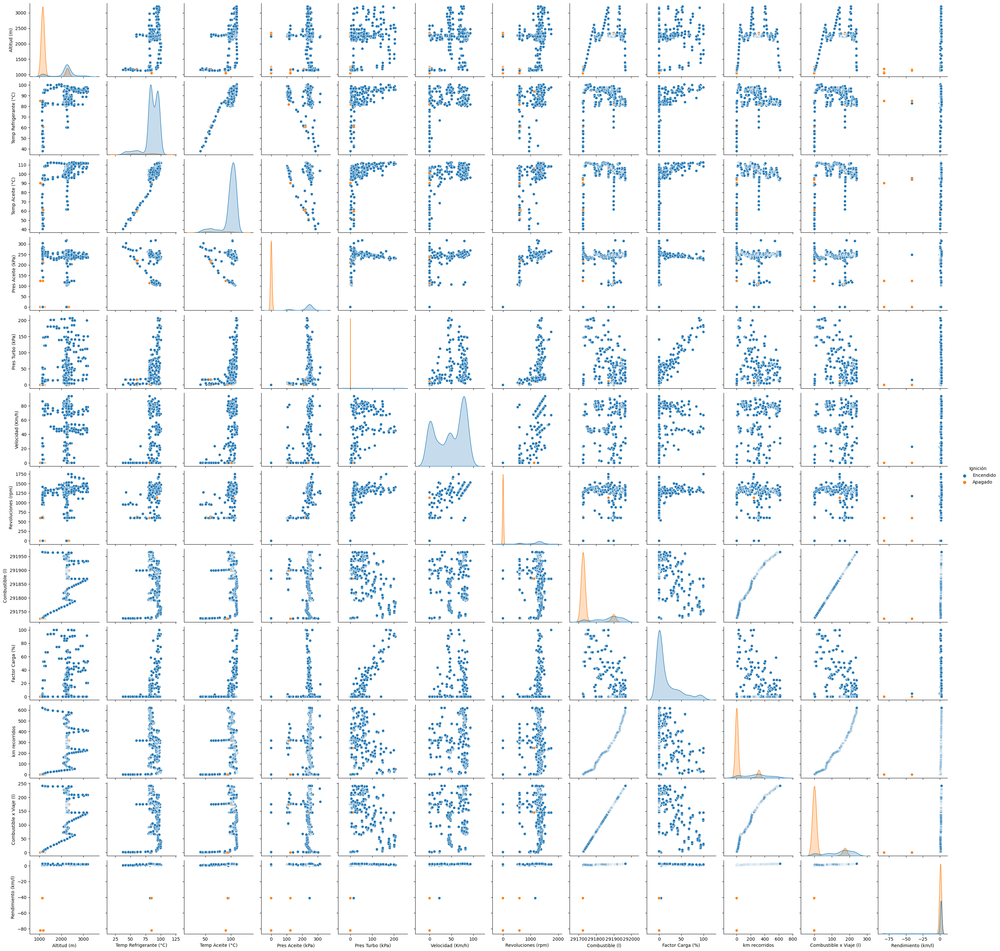

In [5]:
sns.pairplot(reporte, hue="Ignición")

In [6]:
pd.to_datetime(reporte.Fecha)

0      2016-04-23 21:32:49
1      2016-04-23 21:33:53
2      2016-04-23 21:34:53
3      2016-04-23 21:35:53
4      2016-04-23 21:36:53
               ...        
2817   2016-04-25 20:52:13
2818   2016-04-25 20:53:15
2819   2016-04-25 20:54:15
2820   2016-04-25 20:55:15
2821   2016-04-25 20:56:15
Name: Fecha, Length: 2822, dtype: datetime64[ns]

In [7]:
reporte.head()

,Altitud (m),Temp Refrigerante (°C),Temp Aceite (°C),Pres Aceite (kPa),Pres Turbo (kPa),Velocidad (Km/h),Revoluciones (rpm),Combustible (l),Factor Carga (%),Fecha,km recorridos,Ignición,Combustible x Viaje (l),Rendimiento (km/l)
0,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000
1,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704
2,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704
3,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704
4,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704


In [8]:
reporte['datetime'] = pd.to_datetime(reporte.Fecha)

In [9]:
reporte.set_index('datetime', inplace=True)

In [10]:
reporte.head()

,Altitud (m),Temp Refrigerante (°C),Temp Aceite (°C),Pres Aceite (kPa),Pres Turbo (kPa),Velocidad (Km/h),Revoluciones (rpm),Combustible (l),Factor Carga (%),Fecha,km recorridos,Ignición,Combustible x Viaje (l),Rendimiento (km/l)
datetime,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704


In [11]:
reporte.loc['2016-04-23 21' : '2016-04-23 23']

,Altitud (m),Temp Refrigerante (°C),Temp Aceite (°C),Pres Aceite (kPa),Pres Turbo (kPa),Velocidad (Km/h),Revoluciones (rpm),Combustible (l),Factor Carga (%),Fecha,km recorridos,Ignición,Combustible x Viaje (l),Rendimiento (km/l)
datetime,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-23 23:55:38,1157.6,NaN,NaN,0.0,0.000,0.00,0,291724.877115,0.0,23/04/2016 23:55:38,0.48,Apagado,0.507115,0.952056
2016-04-23 23:56:38,1157.6,NaN,NaN,0.0,0.000,0.00,0,291724.877115,0.0,23/04/2016 23:56:38,0.48,Apagado,0.507115,0.952056
2016-04-23 23:57:38,1157.6,NaN,NaN,0.0,0.000,0.00,0,291724.877115,0.0,23/04/2016 23:57:38,0.48,Apagado,0.507115,0.952056


<AxesSubplot: xlabel='datetime'>

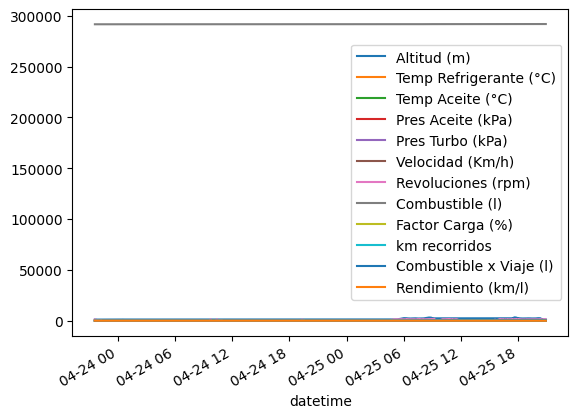

In [12]:
reporte.plot()

<AxesSubplot: xlabel='datetime'>

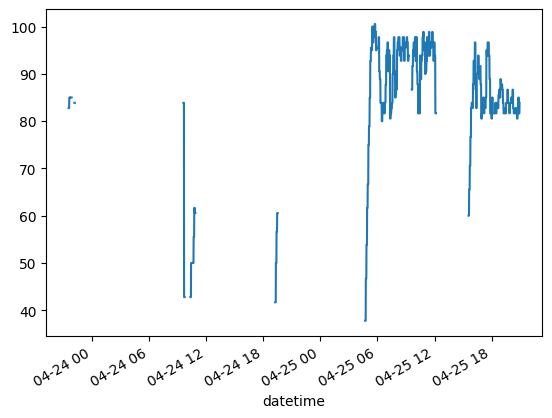

In [13]:
reporte.loc[:, 'Temp Refrigerante (°C)'].plot()

<AxesSubplot: xlabel='datetime'>

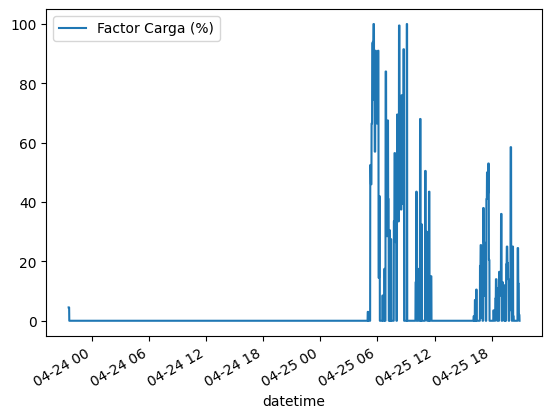

In [14]:
reporte.loc[:, ['Factor Carga (%)']].plot()

<AxesSubplot: xlabel='datetime'>

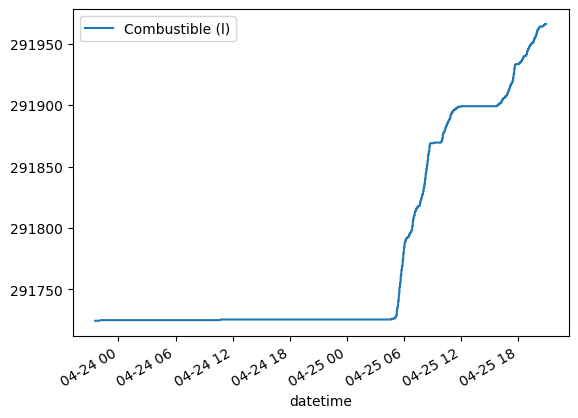

In [15]:
reporte.loc[:, ['Combustible (l)']].plot()

<AxesSubplot: xlabel='datetime'>

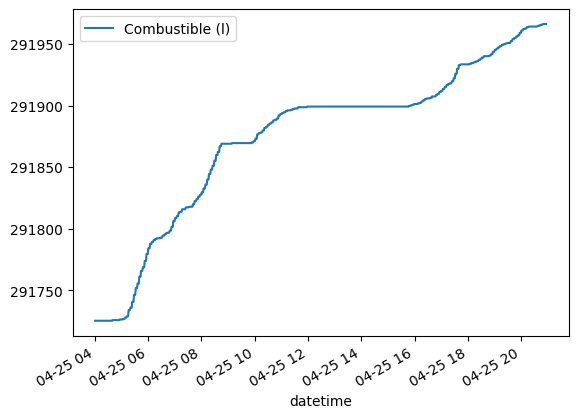

In [16]:
reporte.loc['2016-04-25 04' :, ['Combustible (l)']].plot()

<AxesSubplot: xlabel='datetime'>

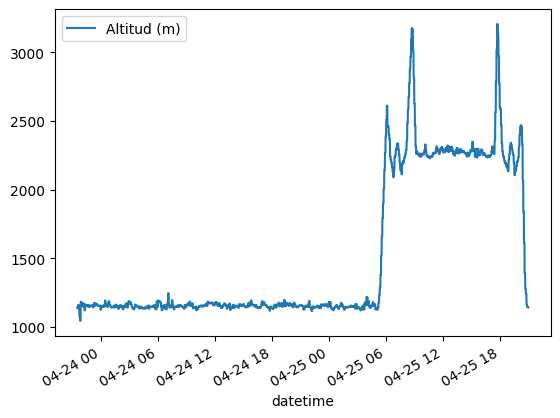

In [17]:
reporte.loc[:, ['Altitud (m)']].plot()

<AxesSubplot: xlabel='datetime'>

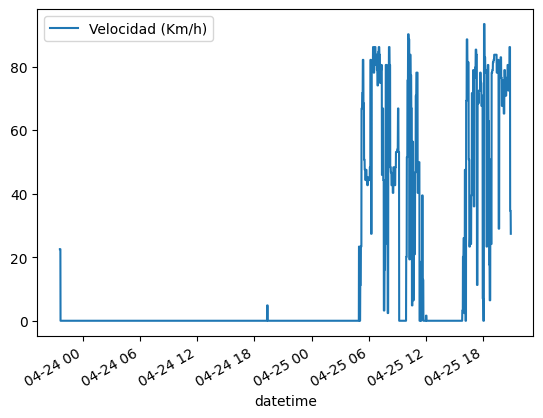

In [18]:
reporte.loc[:, ['Velocidad (Km/h)']].plot()

In [19]:
fallas

,Unidad,Código,Descripción,Fecha
0,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34
1,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34
2,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34
3,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34
4,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34
...,...,...,...,...
61,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
62,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
63,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48
64,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48


# Ejercicio reporte:

1. Modificar los encabezados del DF para simplificar los nombres de los atributos, es decir homogeneizar los nombres de las columnas (eliminar caracteres especiales, espacios, etc.)
2. Hacer DF compañia que indique el nuevo nombre con el nombre original, este debera tener como indice el nuevo nombre de las columnas y su columna el nombre original
3. Generar nuevas columnas con la información de la fecha:
* año
* mes
* dia
* hora
* minuto
* segundo
4. Eliminar las columnas que tienen información duplicada
5. Crear una columna Estado: que utilice la informacion de Velocidad y de Ignición para determinar el estado de operacion 
* A: ignicion apagado y velocidad cero 
* ED: ignicion encendido velocidad cero
* EM: ignicion encendidio velocidad mayo a cero
6. Determinar la frecuencia de muestreo, es decir cada cuanto se tiene un registro
7. Identificar valores faltantes, y tratar de determinar porque faltan
8. Rellenar valores faltantes con base en algun criterio razonable derivado de la exploracion de los datos

In [20]:
reporte.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2822 entries, 2016-04-23 21:32:49 to 2016-04-25 20:56:15
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Altitud (m)              2822 non-null   float64
 1   Temp Refrigerante (°C)   813 non-null    float64
 2   Temp Aceite (°C)         813 non-null    float64
 3   Pres Aceite (kPa)        2822 non-null   float64
 4   Pres Turbo (kPa)         2822 non-null   float64
 5   Velocidad (Km/h)         2822 non-null   float64
 6   Revoluciones (rpm)       2822 non-null   int64  
 7   Combustible (l)          2822 non-null   float64
 8   Factor Carga (%)         2822 non-null   float64
 9   Fecha                    2822 non-null   object 
 10  km recorridos            2822 non-null   float64
 11  Ignición                 2822 non-null   object 
 12  Combustible x Viaje (l)  2822 non-null   float64
 13  Rendimiento (km/l)       2822 non-null   f

1. Modificar los encabezados del DF para simplificar los nombres de los atributos, es decir homogeneizar los nombres de las columnas (eliminar caracteres especiales, espacios, etc.)

Se separan los nombres donde haya un ( y nos quedamos con la parte de la izquierda

Se reemplazan los espacios ' ' por no espacios ''

y se reemplazan las ó por o

In [21]:
original_columns = reporte.columns.copy()
reporte = reporte.set_axis(reporte.columns.str.split('(').str[0].str.replace(' ', '').str.replace('ó', 'o'), axis=1)
reporte.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2822 entries, 2016-04-23 21:32:49 to 2016-04-25 20:56:15
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Altitud            2822 non-null   float64
 1   TempRefrigerante   813 non-null    float64
 2   TempAceite         813 non-null    float64
 3   PresAceite         2822 non-null   float64
 4   PresTurbo          2822 non-null   float64
 5   Velocidad          2822 non-null   float64
 6   Revoluciones       2822 non-null   int64  
 7   Combustible        2822 non-null   float64
 8   FactorCarga        2822 non-null   float64
 9   Fecha              2822 non-null   object 
 10  kmrecorridos       2822 non-null   float64
 11  Ignicion           2822 non-null   object 
 12  CombustiblexViaje  2822 non-null   float64
 13  Rendimiento        2822 non-null   float64
dtypes: float64(11), int64(1), object(2)
memory usage: 395.2+ KB


2. Hacer DF compañia que indique el nuevo nombre con el nombre original, este debera tener como indice el nuevo nombre de las columnas y su columna el nombre original

In [22]:
nueva_column = reporte.columns.copy()

In [23]:
compania = pd.DataFrame(columns= original_columns, index=nueva_column)
compania

,Altitud (m),Temp Refrigerante (°C),Temp Aceite (°C),Pres Aceite (kPa),Pres Turbo (kPa),Velocidad (Km/h),Revoluciones (rpm),Combustible (l),Factor Carga (%),Fecha,km recorridos,Ignición,Combustible x Viaje (l),Rendimiento (km/l)
Altitud,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TempRefrigerante,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TempAceite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PresAceite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PresTurbo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Velocidad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Revoluciones,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Combustible,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FactorCarga,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fecha,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


3. Generar nuevas columnas con la información de la fecha:
* año
* mes
* dia
* hora
* minuto
* segundo

In [24]:
reporte['Año'] = reporte['Fecha'].str.split('/').str[2].str.split(' ').str[0].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año
datetime,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016


In [25]:
reporte['Mes'] = reporte['Fecha'].str.split('/').str[1].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año,Mes
datetime,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016,04
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016,04
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016,04
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016,04
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016,04


In [26]:
reporte['Dia'] = reporte['Fecha'].str.split('/').str[0].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año,Mes,Dia
datetime,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016,04,23
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23


In [27]:
reporte['Hora'] = reporte['Fecha'].str.split('/').str[2].str.split(' ').str[1].str.split(':').str[0].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año,Mes,Dia,Hora
datetime,,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016,04,23,21
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21


In [28]:
reporte['Minuto'] = reporte['Fecha'].str.split('/').str[2].str.split(' ').str[1].str.split(':').str[1].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año,Mes,Dia,Hora,Minuto
datetime,,,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016,04,23,21,32
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,33
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,34
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,35
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,36


In [29]:
reporte['Segundo'] = reporte['Fecha'].str.split('/').str[2].str.split(' ').str[1].str.split(':').str[2].to_frame()
reporte.head()

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,CombustiblexViaje,Rendimiento,Año,Mes,Dia,Hora,Minuto,Segundo
datetime,,,,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,0.000000,2016,04,23,21,32,49
2016-04-23 21:33:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,33,53
2016-04-23 21:34:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,34,53
2016-04-23 21:35:53,1147.5,82.77,95.27,248.4,15.516,22.54,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,35,53
2016-04-23 21:36:53,1147.5,85.00,93.88,124.2,0.862,0.00,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-0.003916,-41.100704,2016,04,23,21,36,53


In [30]:
reporte.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2822 entries, 2016-04-23 21:32:49 to 2016-04-25 20:56:15
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Altitud            2822 non-null   float64
 1   TempRefrigerante   813 non-null    float64
 2   TempAceite         813 non-null    float64
 3   PresAceite         2822 non-null   float64
 4   PresTurbo          2822 non-null   float64
 5   Velocidad          2822 non-null   float64
 6   Revoluciones       2822 non-null   int64  
 7   Combustible        2822 non-null   float64
 8   FactorCarga        2822 non-null   float64
 9   Fecha              2822 non-null   object 
 10  kmrecorridos       2822 non-null   float64
 11  Ignicion           2822 non-null   object 
 12  CombustiblexViaje  2822 non-null   float64
 13  Rendimiento        2822 non-null   float64
 14  Año                2822 non-null   object 
 15  Mes                2822 non-null   o

4. Eliminar las columnas que tienen información duplicada

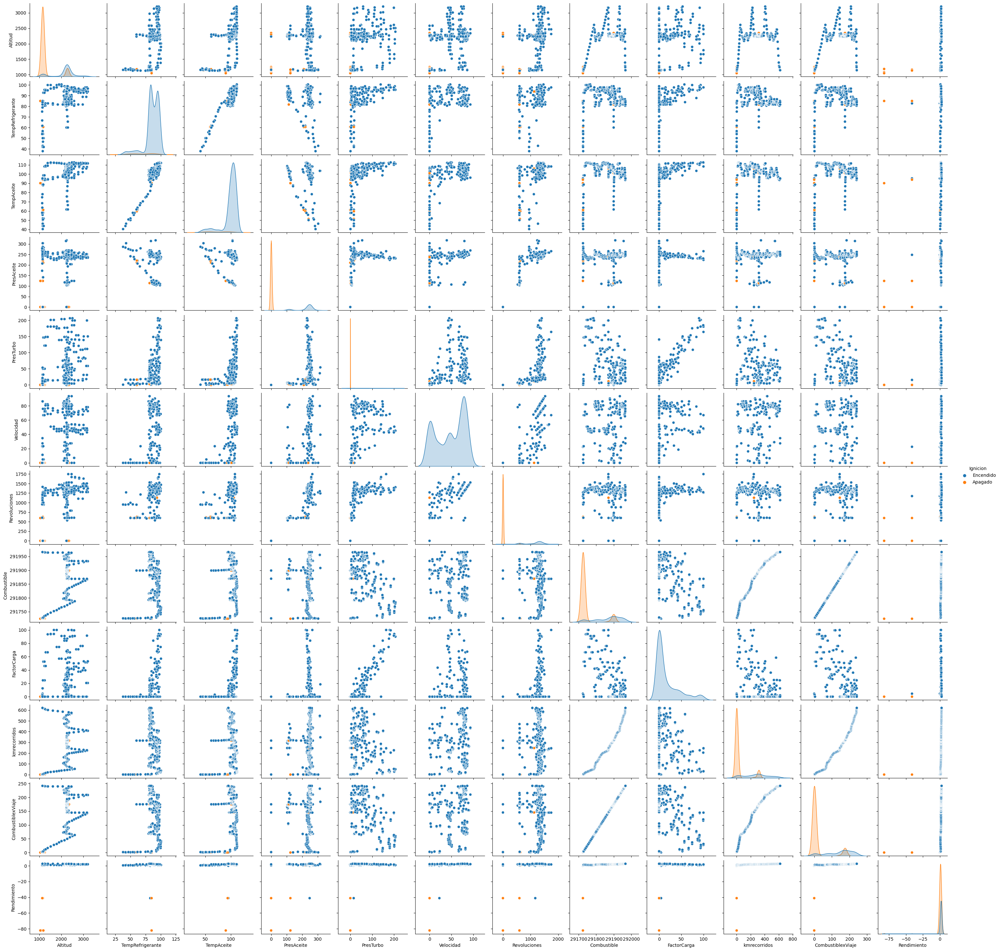

In [31]:
sns.pairplot(reporte, hue="Ignicion")

CombustiblexViaje es el atributo que da información duplicada

In [32]:
reporte = reporte.drop('CombustiblexViaje', axis=1)

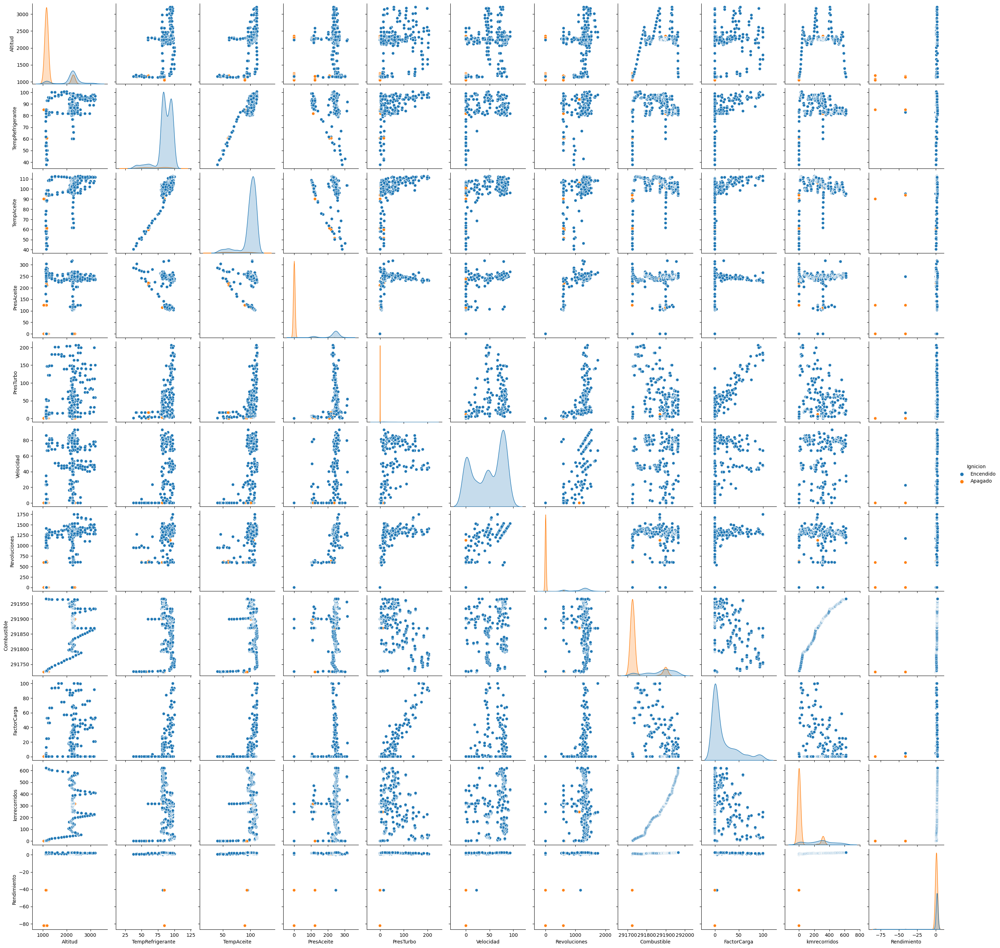

In [33]:
sns.pairplot(reporte, hue="Ignicion")

5. Crear una columna Estado: que utilice la informacion de Velocidad y de Ignición para determinar el estado de operacion 
* A: ignicion apagado y velocidad cero 
* ED: ignicion encendido velocidad cero
* EM: ignicion encendidio velocidad mayo a cero

Se crea la columna Estado con A en los renglones correspondientes y valores vacios en los que no cumplen esa condicion

In [34]:
reporte['Estado'] = (reporte[reporte['Ignicion'] == 'Apagado']['Velocidad'] == 0).to_frame().replace(True, 'A')

In [35]:
reporte.Estado.value_counts()

A    2023
Name: Estado, dtype: int64

In [36]:
reporte.Estado.isnull().sum()

799

Se rellenan los vacios que cumplen la condicion de ED

In [37]:
ed = reporte.loc[(reporte[reporte['Ignicion'] == 'Encendido']['Velocidad'] == 0).to_frame().groupby('Velocidad').get_group(True).index].Estado.fillna('ED')

In [38]:
reporte.Estado.fillna(ed, inplace=True)

In [39]:
reporte.Estado.value_counts()

A     2023
ED     142
Name: Estado, dtype: int64

Se rellenan los vacios que cumplen la condicion de EM

In [40]:
em = reporte.loc[(reporte[reporte['Ignicion'] == 'Encendido']['Velocidad'] > 0).to_frame().groupby('Velocidad').get_group(True).index].Estado.fillna('EM')

In [41]:
reporte.Estado.fillna(em, inplace=True)

In [42]:
reporte.Estado.value_counts()

A     2023
EM     657
ED     142
Name: Estado, dtype: int64

In [43]:
reporte.Estado.isna().sum()

0

In [44]:
reporte

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,Rendimiento,Año,Mes,Dia,Hora,Minuto,Segundo,Estado
datetime,,,,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,2016,04,23,21,32,49,EM
2016-04-23 21:33:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-41.100704,2016,04,23,21,33,53,EM
2016-04-23 21:34:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-41.100704,2016,04,23,21,34,53,EM
2016-04-23 21:35:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-41.100704,2016,04,23,21,35,53,EM
2016-04-23 21:36:53,1147.5,85.00,93.88,124.20,0.862,0.000,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-41.100704,2016,04,23,21,36,53,ED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-25 20:52:13,1148.3,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:52:13,618.46,Encendido,2.558687,2016,04,25,20,52,13,EM
2016-04-25 20:53:15,1143.5,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:53:15,620.07,Encendido,2.565345,2016,04,25,20,53,15,EM
2016-04-25 20:54:15,1143.5,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:54:15,620.07,Encendido,2.565345,2016,04,25,20,54,15,EM


6. Determinar la frecuencia de muestreo, es decir cada cuanto se tiene un registro

Se utiliza la función .diff() para obtener la diferencia entre un renglon y el siguiente, esta diferencia es el tiempo entre cada muestra.

In [45]:
pd.to_datetime(reporte.Fecha).diff()

datetime
2016-04-23 21:32:49               NaT
2016-04-23 21:33:53   0 days 00:01:04
2016-04-23 21:34:53   0 days 00:01:00
2016-04-23 21:35:53   0 days 00:01:00
2016-04-23 21:36:53   0 days 00:01:00
                            ...      
2016-04-25 20:52:13   0 days 00:01:00
2016-04-25 20:53:15   0 days 00:01:02
2016-04-25 20:54:15   0 days 00:01:00
2016-04-25 20:55:15   0 days 00:01:00
2016-04-25 20:56:15   0 days 00:01:00
Name: Fecha, Length: 2822, dtype: timedelta64[ns]

Se puede notar que no todas tienen el mismo valor, veamos sus estadisticas

In [46]:
pd.to_datetime(reporte.Fecha).diff().describe()

count                         2821
mean     0 days 00:01:00.477135767
std      0 days 00:00:08.427197090
min                0 days 00:00:41
25%                0 days 00:01:00
50%                0 days 00:01:00
75%                0 days 00:01:00
max                0 days 00:07:58
Name: Fecha, dtype: object

In [47]:
pd.to_datetime(reporte.Fecha).diff().value_counts()

0 days 00:01:00    2155
0 days 00:01:01     107
0 days 00:01:02      65
0 days 00:01:04      40
0 days 00:00:59      35
0 days 00:01:07      33
0 days 00:00:58      33
0 days 00:01:08      30
0 days 00:01:03      30
0 days 00:00:55      29
0 days 00:00:57      27
0 days 00:00:54      24
0 days 00:01:05      23
0 days 00:00:56      23
0 days 00:01:09      23
0 days 00:01:11      22
0 days 00:01:10      20
0 days 00:00:52      20
0 days 00:01:06      19
0 days 00:00:53      16
0 days 00:00:51      11
0 days 00:01:12       5
0 days 00:00:50       4
0 days 00:00:42       3
0 days 00:00:46       3
0 days 00:00:41       2
0 days 00:01:20       2
0 days 00:01:17       2
0 days 00:00:48       2
0 days 00:01:14       2
0 days 00:00:49       2
0 days 00:00:47       1
0 days 00:01:22       1
0 days 00:00:45       1
0 days 00:01:18       1
0 days 00:07:58       1
0 days 00:01:21       1
0 days 00:01:23       1
0 days 00:01:15       1
0 days 00:01:13       1
Name: Fecha, dtype: int64

Se puede notar que no siempre se toman las medidas con la misma frecuencia, sin embargo lo mas comun es tomarlo cada segundo.

7. Identificar valores faltantes, y tratar de determinar porque faltan

In [48]:
reporte.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2822 entries, 2016-04-23 21:32:49 to 2016-04-25 20:56:15
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Altitud           2822 non-null   float64
 1   TempRefrigerante  813 non-null    float64
 2   TempAceite        813 non-null    float64
 3   PresAceite        2822 non-null   float64
 4   PresTurbo         2822 non-null   float64
 5   Velocidad         2822 non-null   float64
 6   Revoluciones      2822 non-null   int64  
 7   Combustible       2822 non-null   float64
 8   FactorCarga       2822 non-null   float64
 9   Fecha             2822 non-null   object 
 10  kmrecorridos      2822 non-null   float64
 11  Ignicion          2822 non-null   object 
 12  Rendimiento       2822 non-null   float64
 13  Año               2822 non-null   object 
 14  Mes               2822 non-null   object 
 15  Dia               2822 non-null   object 
 16  Hora  

In [49]:
reporte.isnull().sum()

Altitud                0
TempRefrigerante    2009
TempAceite          2009
PresAceite             0
PresTurbo              0
Velocidad              0
Revoluciones           0
Combustible            0
FactorCarga            0
Fecha                  0
kmrecorridos           0
Ignicion               0
Rendimiento            0
Año                    0
Mes                    0
Dia                    0
Hora                   0
Minuto                 0
Segundo                0
Estado                 0
dtype: int64

In [50]:
reporte.loc[reporte['TempRefrigerante'].isnull()]

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,Rendimiento,Año,Mes,Dia,Hora,Minuto,Segundo,Estado
datetime,,,,,,,,,,,,,,,,,,,,
2016-04-23 21:40:48,1161.5,NaN,NaN,0.0,0.0,0.0,0,291724.366084,0.0,23/04/2016 21:40:48,0.16,Apagado,-41.100704,2016,04,23,21,40,48,A
2016-04-23 21:41:50,1134.4,NaN,NaN,0.0,0.0,0.0,0,291724.366084,0.0,23/04/2016 21:41:50,0.16,Apagado,-41.100704,2016,04,23,21,41,50,A
2016-04-23 21:42:50,1134.4,NaN,NaN,0.0,0.0,0.0,0,291724.366084,0.0,23/04/2016 21:42:50,0.16,Apagado,-41.100704,2016,04,23,21,42,50,A
2016-04-23 21:43:50,1134.4,NaN,NaN,0.0,0.0,0.0,0,291724.366084,0.0,23/04/2016 21:43:50,0.16,Apagado,-41.100704,2016,04,23,21,43,50,A
2016-04-23 21:44:50,1134.4,NaN,NaN,0.0,0.0,0.0,0,291724.366084,0.0,23/04/2016 21:44:50,0.16,Apagado,-41.100704,2016,04,23,21,44,50,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-25 15:29:29,2297.4,NaN,NaN,0.0,0.0,0.0,0,291899.138545,0.0,25/04/2016 15:29:29,316.23,Apagado,1.809452,2016,04,25,15,29,29,A
2016-04-25 15:30:29,2297.4,NaN,NaN,0.0,0.0,0.0,0,291899.138545,0.0,25/04/2016 15:30:29,316.23,Apagado,1.809452,2016,04,25,15,30,29,A
2016-04-25 15:31:30,2234.3,NaN,NaN,0.0,0.0,0.0,0,291899.138545,0.0,25/04/2016 15:31:30,316.23,Apagado,1.809452,2016,04,25,15,31,30,A


In [51]:
reporte.loc[reporte['TempRefrigerante'].isnull()]['Estado'].value_counts()

A     1996
ED      13
Name: Estado, dtype: int64

Se puede ver que los valores faltantes en TempRefrigerante son porque el vehiculo esta detenido. Veamos si es cierto en ambas columnas.

In [52]:
reporte.loc[reporte['TempRefrigerante'].isnull()]['Velocidad'] == 0

datetime
2016-04-23 21:40:48    True
2016-04-23 21:41:50    True
2016-04-23 21:42:50    True
2016-04-23 21:43:50    True
2016-04-23 21:44:50    True
                       ... 
2016-04-25 15:29:29    True
2016-04-25 15:30:29    True
2016-04-25 15:31:30    True
2016-04-25 15:32:30    True
2016-04-25 15:33:30    True
Name: Velocidad, Length: 2009, dtype: bool

In [53]:
reporte.loc[reporte['TempAceite'].isnull()]['Velocidad'] == 0


datetime
2016-04-23 21:40:48    True
2016-04-23 21:41:50    True
2016-04-23 21:42:50    True
2016-04-23 21:43:50    True
2016-04-23 21:44:50    True
                       ... 
2016-04-25 15:29:29    True
2016-04-25 15:30:29    True
2016-04-25 15:31:30    True
2016-04-25 15:32:30    True
2016-04-25 15:33:30    True
Name: Velocidad, Length: 2009, dtype: bool

In [54]:
index_missing_values_tr = (reporte.loc[reporte['TempRefrigerante'].isnull()]['Velocidad'] == 0).index
index_missing_values_ta = (reporte.loc[reporte['TempAceite'].isnull()]['Velocidad'] == 0).index
(index_missing_values_ta == index_missing_values_tr).sum()

2009

Los indices de los valores faltantes en las dos columnas son los mismos, por lo que se puede ver que los valores faltantes se debe a que cuando el vehiculo esta parado no se esta sensando la temperatura del refrigerante y el aceite.

8. Rellenar valores faltantes con base en algun criterio razonable derivado de la exploracion de los datos

<AxesSubplot: xlabel='datetime'>

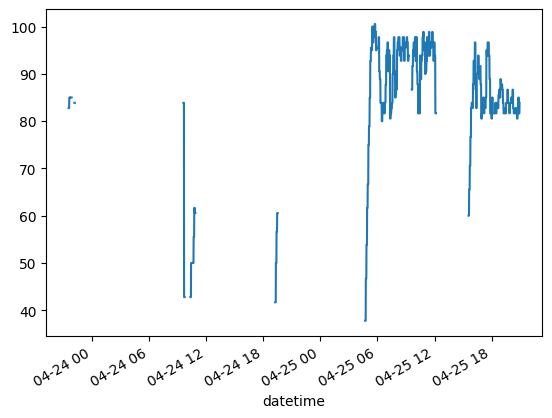

In [55]:
reporte['TempRefrigerante'].plot()

Al estar el vehiculo detenido la temperatura se tendria que mantener constante o bajar. Como se puede ver en la sección faltante entre el 04-24 00 y 04-24 06 la temperatura del ultimo punto y del primero cuando vuelve a sensar es la misma. Mientras que en las otras tres secciones se puede ver que la temperatura disminuye si se comparan el ultimo valor sensado y el nuevo siguiente.

<AxesSubplot: xlabel='datetime'>

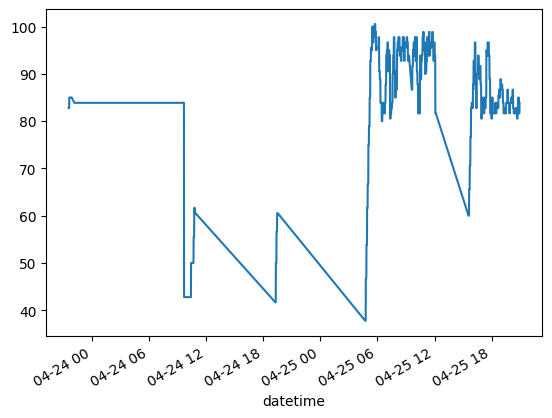

In [56]:
reporte['TempRefrigerante'].dropna().plot()

Al saltar los valores faltantes se puede ver de mejor manera que efectivamente la temperatura se mantiene constante o disminuye.

<AxesSubplot: xlabel='datetime'>

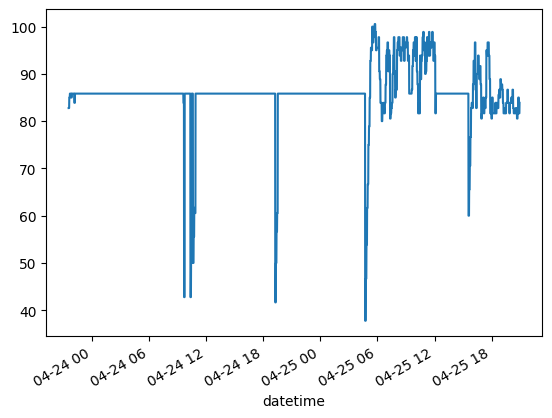

In [57]:
reporte['TempRefrigerante'].fillna(reporte['TempRefrigerante'].mean()).plot()

Si se rellena con el promedio se pierde este comportamiento.

<AxesSubplot: xlabel='datetime'>

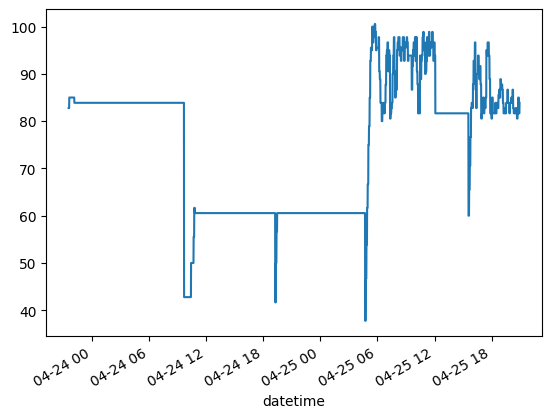

In [58]:
reporte['TempRefrigerante'].fillna(method='ffill').plot()

<AxesSubplot: xlabel='datetime'>

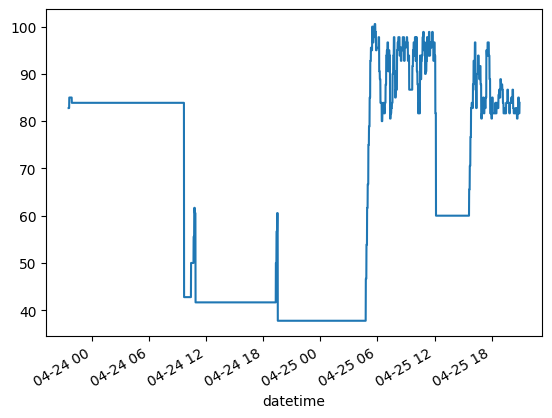

In [59]:
reporte['TempRefrigerante'].fillna(method='bfill').plot()

Igualmente se pierden el comportamiento con forward y backwardfill.

<AxesSubplot: xlabel='datetime'>

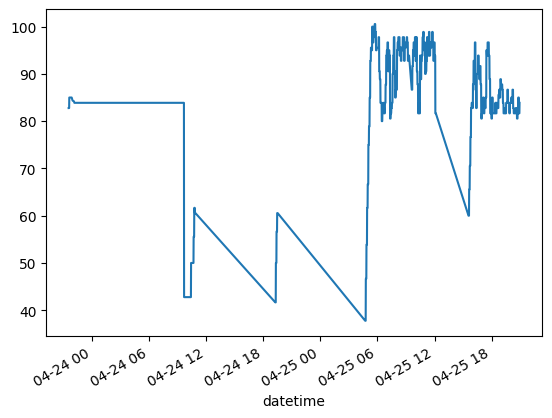

In [60]:
reporte['TempRefrigerante'].interpolate().plot()

Interpolate es la que mejor mantiene el comportamiento de la temperatura permaneciendo constante o disminuyendo.

<AxesSubplot: xlabel='datetime'>

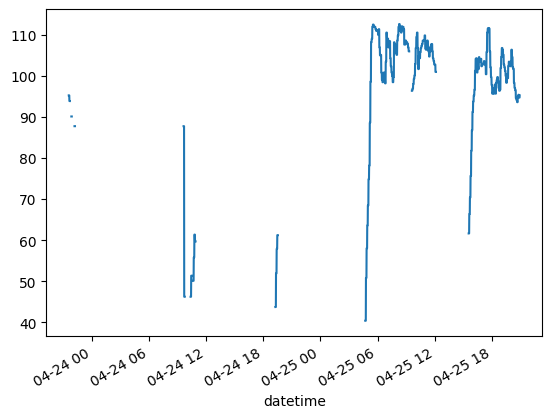

In [61]:
reporte['TempAceite'].plot()

<AxesSubplot: xlabel='datetime'>

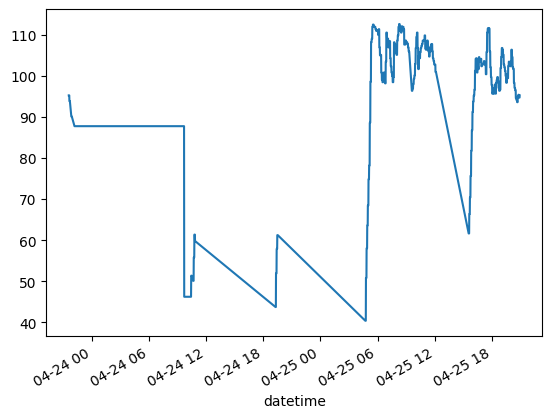

In [62]:
reporte['TempAceite'].dropna().plot()

Se aprecia el mismo comportamiento con la temperatura del aceite por lo que ambos se rellenan con interpolate.

In [63]:
reporte_completo = reporte.interpolate()
reporte_completo.isnull().sum()

Altitud             0
TempRefrigerante    0
TempAceite          0
PresAceite          0
PresTurbo           0
Velocidad           0
Revoluciones        0
Combustible         0
FactorCarga         0
Fecha               0
kmrecorridos        0
Ignicion            0
Rendimiento         0
Año                 0
Mes                 0
Dia                 0
Hora                0
Minuto              0
Segundo             0
Estado              0
dtype: int64

In [64]:
reporte_completo

,Altitud,TempRefrigerante,TempAceite,PresAceite,PresTurbo,Velocidad,Revoluciones,Combustible,FactorCarga,Fecha,kmrecorridos,Ignicion,Rendimiento,Año,Mes,Dia,Hora,Minuto,Segundo,Estado
datetime,,,,,,,,,,,,,,,,,,,,
2016-04-23 21:32:49,1139.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:32:49,0.00,Encendido,0.000000,2016,04,23,21,32,49,EM
2016-04-23 21:33:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:33:53,0.16,Encendido,-41.100704,2016,04,23,21,33,53,EM
2016-04-23 21:34:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:34:53,0.16,Encendido,-41.100704,2016,04,23,21,34,53,EM
2016-04-23 21:35:53,1147.5,82.77,95.27,248.40,15.516,22.540,1171,291724.366084,4.5,23/04/2016 21:35:53,0.16,Encendido,-41.100704,2016,04,23,21,35,53,EM
2016-04-23 21:36:53,1147.5,85.00,93.88,124.20,0.862,0.000,597,291724.366084,0.0,23/04/2016 21:36:53,0.16,Encendido,-41.100704,2016,04,23,21,36,53,ED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-25 20:52:13,1148.3,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:52:13,618.46,Encendido,2.558687,2016,04,25,20,52,13,EM
2016-04-25 20:53:15,1143.5,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:53:15,620.07,Encendido,2.565345,2016,04,25,20,53,15,EM
2016-04-25 20:54:15,1143.5,81.66,94.72,244.95,19.826,34.615,1065,291966.083552,2.0,25/04/2016 20:54:15,620.07,Encendido,2.565345,2016,04,25,20,54,15,EM


# Ejercicio fallas

1. Homogeneizar los nombre de las columnas (eliminar caracteres especiales, espacios, etc.)
2. Corregir los nombres de las columnas, Unidad <-> Codigo
3. Modificar el indice para que sea la fecha- observar si se pierden datos

In [65]:
fallas

,Unidad,Código,Descripción,Fecha
0,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34
1,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34
2,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34
3,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34
4,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34
...,...,...,...,...
61,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
62,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
63,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48
64,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48


In [66]:
fallas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66 entries, 0 to 65
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unidad       66 non-null     object
 1   Código       66 non-null     object
 2   Descripción  66 non-null     object
 3   Fecha        66 non-null     object
dtypes: object(4)
memory usage: 2.2+ KB


1. Homogeneizar los nombre de las columnas (eliminar caracteres especiales, espacios, etc.)

In [67]:
fallas = fallas.set_axis(fallas.columns.str.replace('ó', 'o'), axis=1)
fallas

,Unidad,Codigo,Descripcion,Fecha
0,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34
1,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34
2,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34
3,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34
4,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34
...,...,...,...,...
61,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
62,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
63,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48
64,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48


2. Corregir los nombres de las columnas, Unidad <-> Codigo2. Corregir los nombres de las columnas, Unidad <-> Codigo

In [68]:
fallas = fallas.rename(columns={fallas.columns[0]: fallas.columns[1], fallas.columns[1]: fallas.columns[0]})
fallas

,Codigo,Unidad,Descripcion,Fecha
0,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34
1,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34
2,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34
3,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34
4,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34
...,...,...,...,...
61,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
62,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
63,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48
64,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48


3. Modificar el indice para que sea la fecha- observar si se pierden datos

In [69]:
fallas['datetime'] = pd.to_datetime(fallas.Fecha)
fallas

,Codigo,Unidad,Descripcion,Fecha,datetime
0,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34,2016-04-25 15:34:00
1,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34,2016-04-25 15:34:00
2,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34,2016-04-25 15:34:00
3,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34,2016-04-25 15:34:00
4,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34,2016-04-25 15:34:00
...,...,...,...,...,...
61,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48,2016-04-23 21:48:00
62,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48,2016-04-23 21:48:00
63,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48,2016-04-23 21:48:00
64,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48,2016-04-23 21:48:00


In [70]:
fallas.set_index('datetime', inplace=True)
fallas

,Codigo,Unidad,Descripcion,Fecha
datetime,,,,
2016-04-25 15:34:00,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,25/04/2016 15:34
2016-04-25 15:34:00,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,25/04/2016 15:34
2016-04-25 15:34:00,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,25/04/2016 15:34
2016-04-25 15:34:00,1117,T9041,Suministro de Energía Perdido Con Conexión del...,25/04/2016 15:34
2016-04-25 15:34:00,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,25/04/2016 15:34
...,...,...,...,...
2016-04-23 21:48:00,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
2016-04-23 21:48:00,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
2016-04-23 21:48:00,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48


In [71]:
fallas.loc['2016-04-23 21:48']

,Codigo,Unidad,Descripcion,Fecha
datetime,,,,
2016-04-23 21:48:00,Falla no definida,T9041,Falla generica frenos.-Vínculo de datos SAE J1...,23/04/2016 21:48
2016-04-23 21:48:00,144,T9041,Circuito 1 del Sensor de Temperatura de Refrig...,23/04/2016 21:48
2016-04-23 21:48:00,2372,T9041,Presión Diferencial del Filtro de Combustible ...,23/04/2016 21:48
2016-04-23 21:48:00,153,T9041,Circuito del Sensor de Temperatura 1 del Múlti...,23/04/2016 21:48
2016-04-23 21:48:00,195,T9041,Circuito del Sensor de Nivel de Refrigerante 1...,23/04/2016 21:48
2016-04-23 21:48:00,123,T9041,Circuito del Sensor de Presión 1 del Múltiple ...,23/04/2016 21:48
2016-04-23 21:48:00,1117,T9041,Suministro de Energía Perdido Con Conexión del...,23/04/2016 21:48


No se pierde pierde información, se mantienen los 66 renglones y al llamar por una fecha y hora especifica regresa todos los renglones que ocurrieron al mismo tiempo.

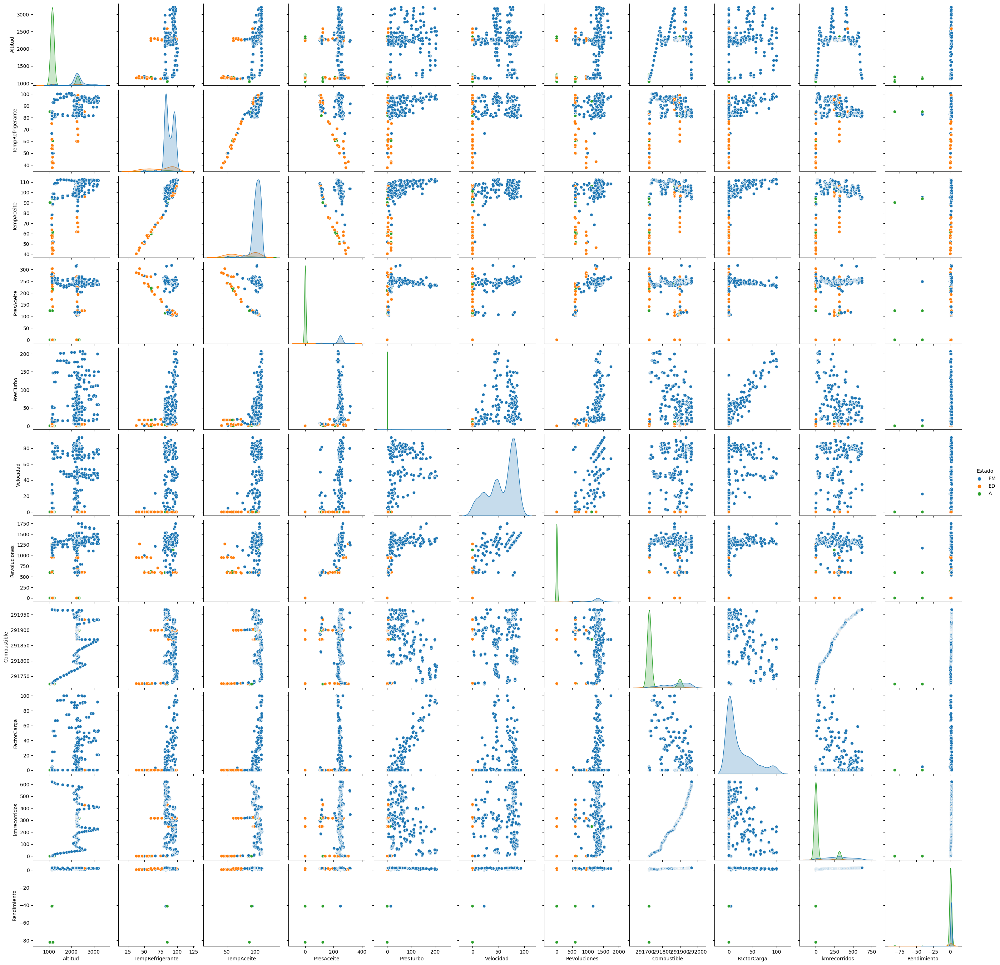

In [72]:
sns.pairplot(reporte, hue="Estado")

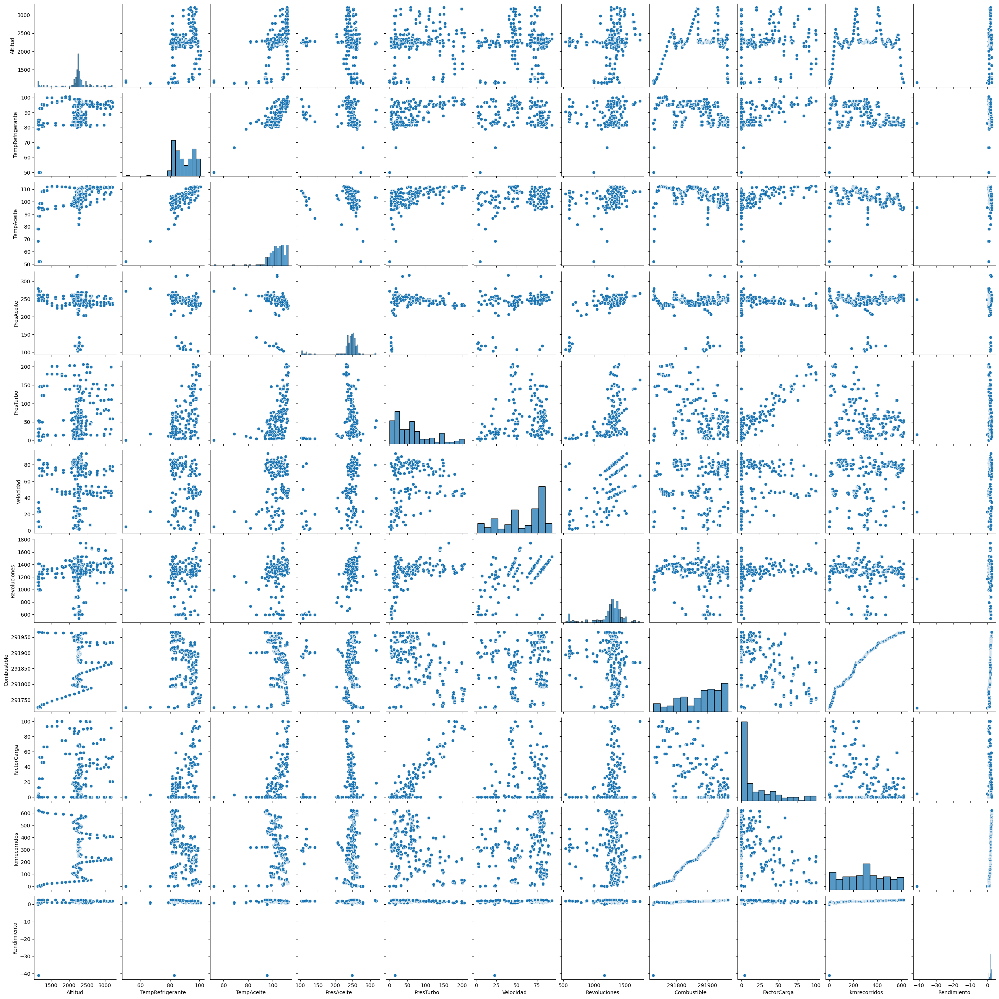

In [76]:
sns.pairplot(reporte.groupby('Estado').get_group('EM'))

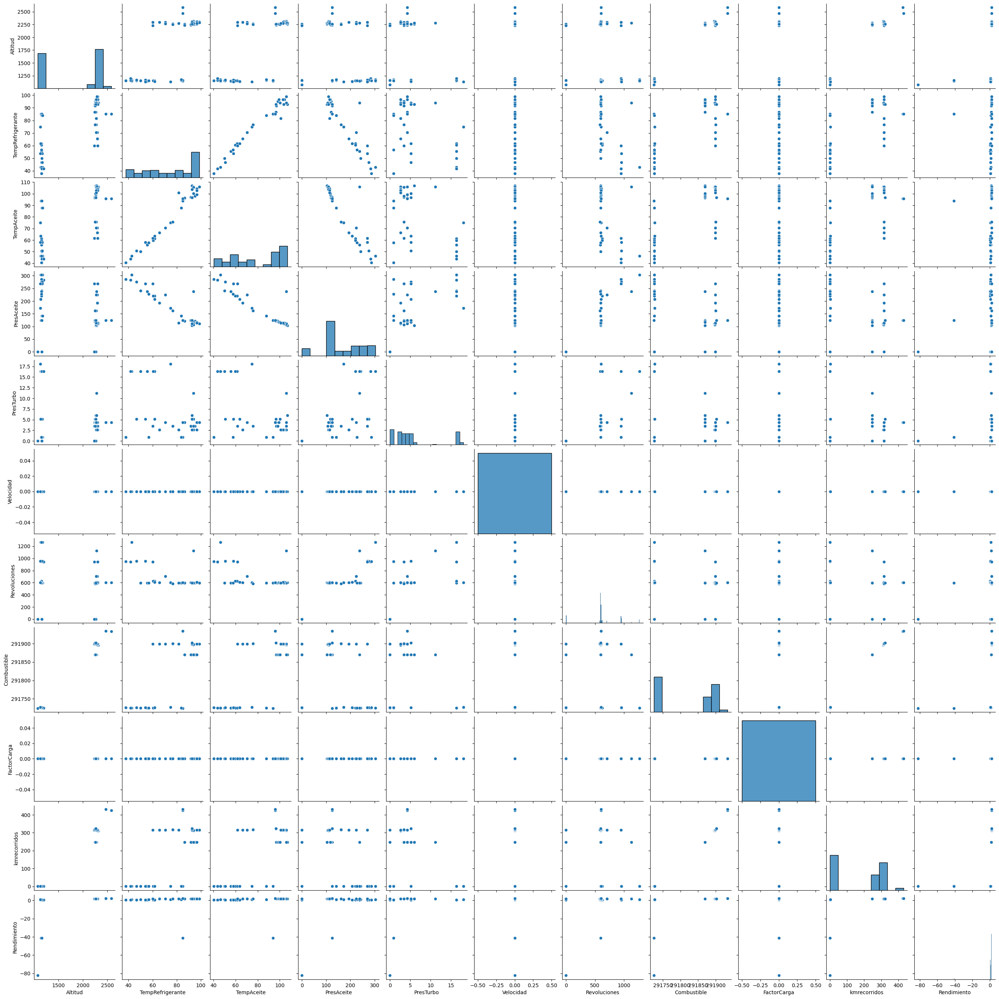

In [77]:
sns.pairplot(reporte.groupby('Estado').get_group('ED'))

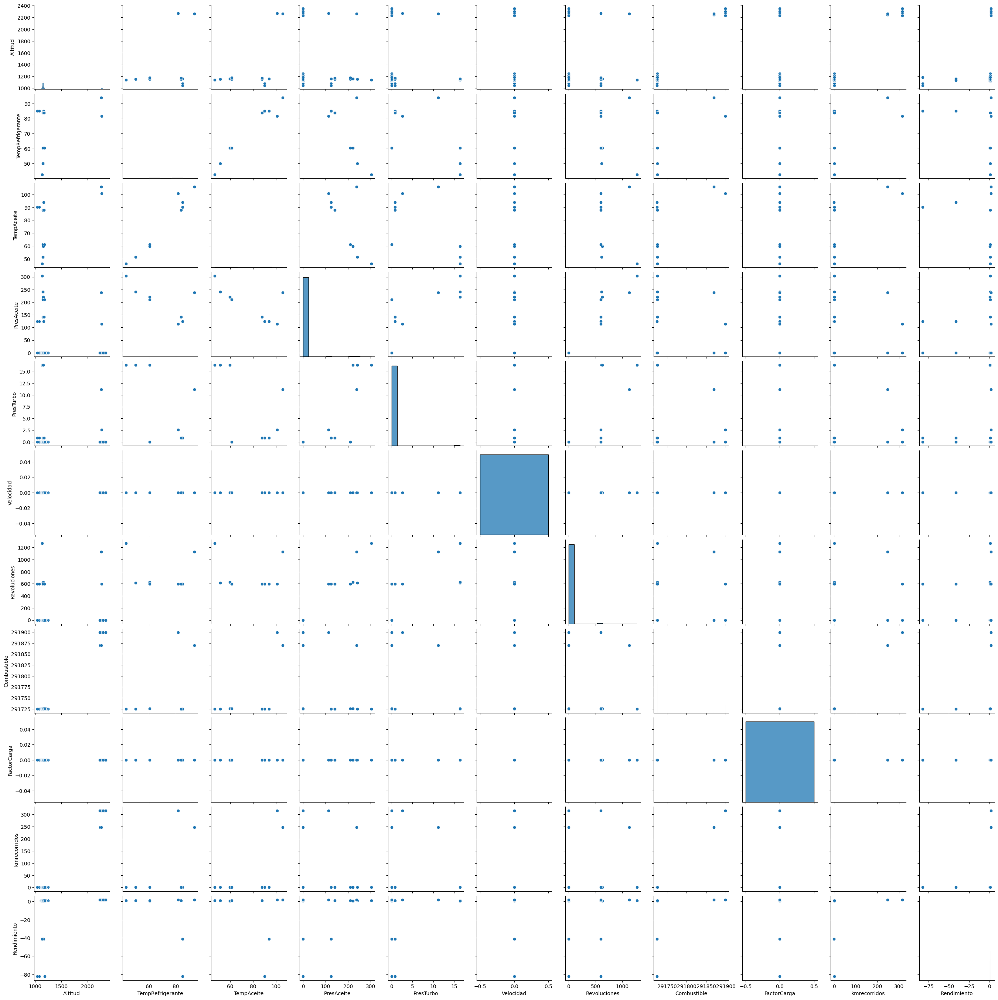

In [78]:
sns.pairplot(reporte.groupby('Estado').get_group('A'))